In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

Energy relaxation:   0%|          | 0/100000 [00:00<?, ?it/s]

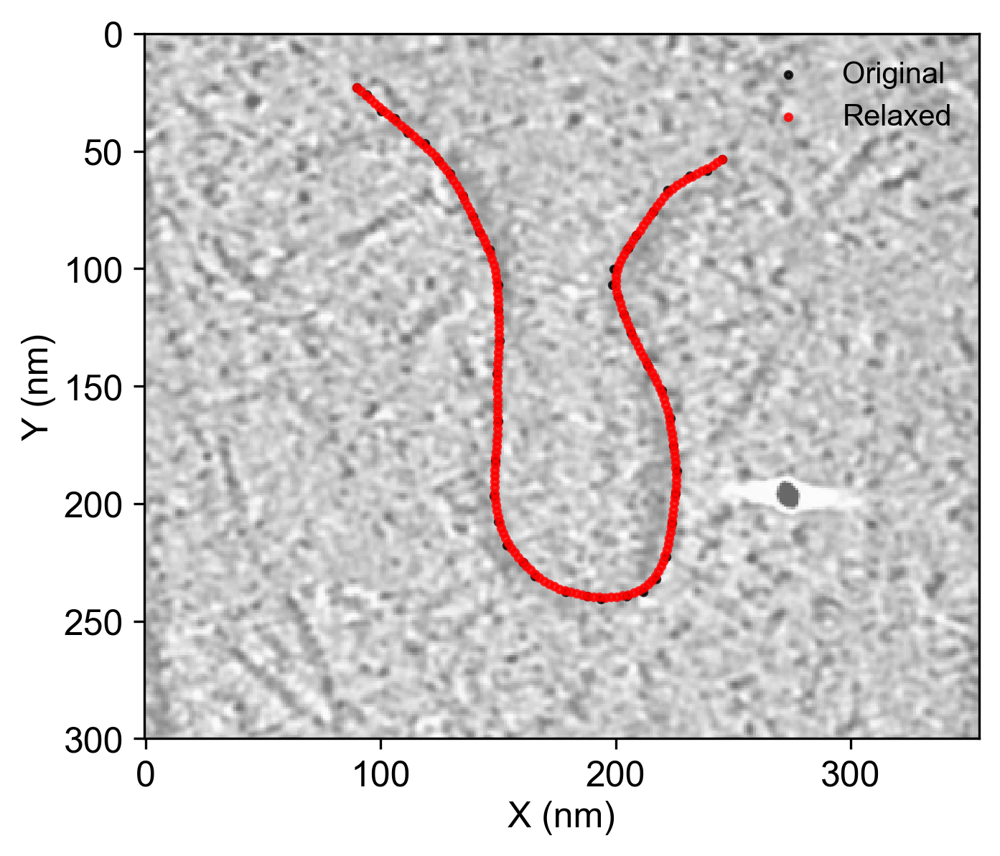

In [2]:
# Preprocessing and relaxing

from variation_relax import preprocess_mesh, relax_bending
from plot import plot_dots
import os

## relaxation step ##
coords, original_coords = preprocess_mesh(file, resample_geometry=True, n_vertices=200)

params = {
    "Kb": 10,
    "Ksg": 10,
    "Ksl": 10,
    "dt": 1e-5,
    # "n_iter": int(8e2),
    "n_iter": int(1e5),
    "boundary": "pinned",
}
relaxed_coords = relax_bending(coords, **params)

file_path = os.path.join(f"dat/coat_test", "relaxed_coords.npy")
np.save(file_path, relaxed_coords)

plot_dots(file.stem, original_coords, relaxed_coords)

Summary of protocol for estimating forces on the membrane. Nuclei were traced from the EM images manually using Fiji. Assuming the Helfrich-Canham-Evans and surface energy of the membrane,

$$E =  \underbrace{\int_\Omega \kappa_b (H-\bar{H})^2 dA}_{E_b} + \underbrace{\int_\Omega \sigma dA}_{E_\sigma},$$

where $\kappa_b$ is the bending modulus, $H$ is the mean curvature given by the two principal curvatures, $(k_1 + k_2)/2$,  $\sigma$ is the prescribed constant surface tension, and $dA$ the area element. Given that the segmented EM images are plane curves, we assume naively that the out of plane principal curvature is naught ($k_2 = 0$). Rewriting as an energy density (per length) and simplifying,

$$\frac{E_b}{l} =\frac{\kappa_b}{4} \int_C (k_1 - \bar{k}_1)^2 ds,$$

and 

$$\frac{E_\sigma}{l} =  \sigma \int_C ds,$$ 


where $l$ is the depth relating the integrals over area, $\Omega$, and the plane curve, $C$; $ds$ is the arc-length element. To obtain the areal force density $f$ such that $f ds = -\nabla (E/l)$, we use automatic differentiation using [`jax`](https://jax.readthedocs.io). Note that $f$ is independent of the length scale $l$. We choose the sum of half the length of each incident edge to be the dual length, $ds_i$, of the $i^{\text{th}}$ vertex, $v_i$.

0.0
0.17092840121642727


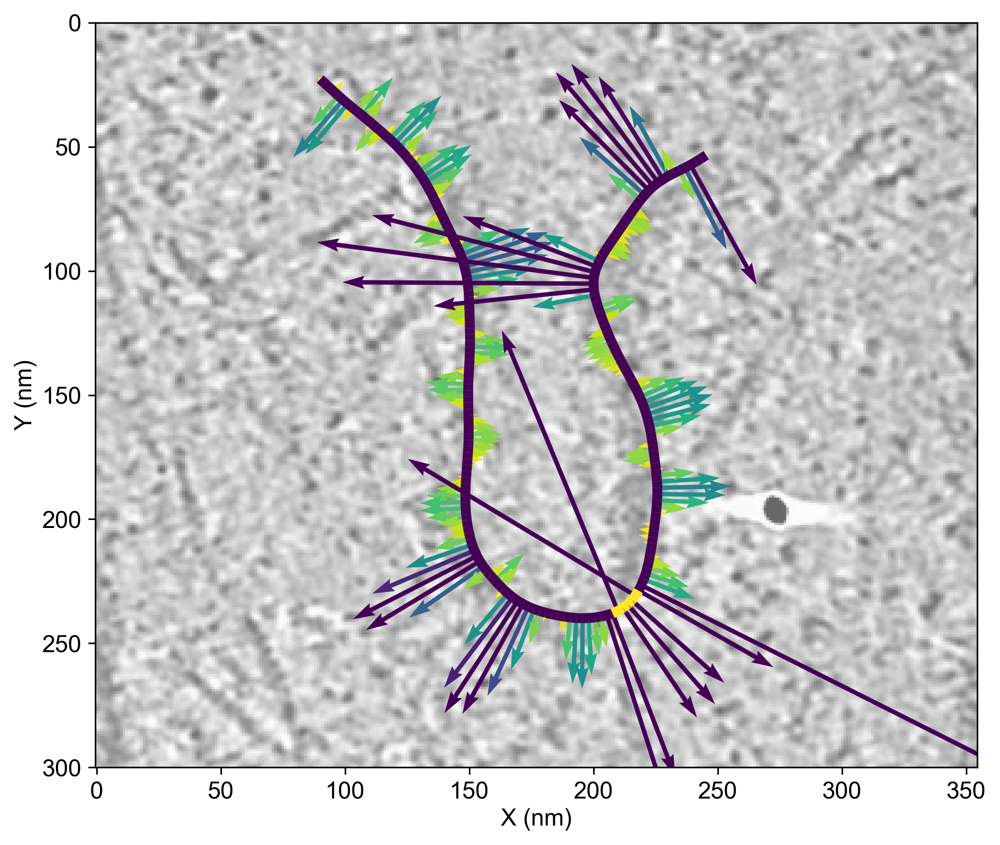

In [25]:
# Working space

import numpy as np
from pathlib import Path
from variation_run import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry


file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

coords = np.load(f"dat/coat_test/relaxed_coords.npy")
# relaxed_coords = np.load(f"figures/bcs_test/bc_pinned_reflect/relaxed_coords.npy")

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    # "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksg": 1,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

# cvt = 0.08
# spont_c = np.full(relaxed_coords.shape[0]-1, cvt)


cvt_thre = -0.04

curvature = OpenPlaneCurveGeometry.edge_curvature(coords)
spont_c = np.where(curvature < cvt_thre, curvature, 0)
# spont_c = np.where(curvature < cvt_thre, cvt_thre, 0)

# curvature = OpenPlaneCurveGeometry.edge_curvature(coords)
# cvt_neg = curvature[curvature < 0]
# avg_cvt_neg = np.mean(cvt_neg)
# spont_c = np.where(curvature < 0, avg_cvt_neg, 0)

forces = get_force_density(parameters, coords, spont_c)

print(np.min(np.abs(forces[0,:])))
print(np.max(np.abs(forces[0,:])))

curvature_bin = np.where(curvature < cvt_thre, 1, 0)

# plot_coord_curve_force(file.stem, coords, curvature_bin, forces[0,:], ylim=(300, 0), scale_factor=0.001, force_vmin=0.005, force_vmax=0.05)
plot_coord_curve_force(file.stem, coords, curvature_bin, forces[0,:] + forces[1,:], ylim=(300, 0), scale_factor=0.001, force_vmin=0.005, force_vmax=0.05)



0.055001065
-0.05358469
-0.0026696993
0.01364672


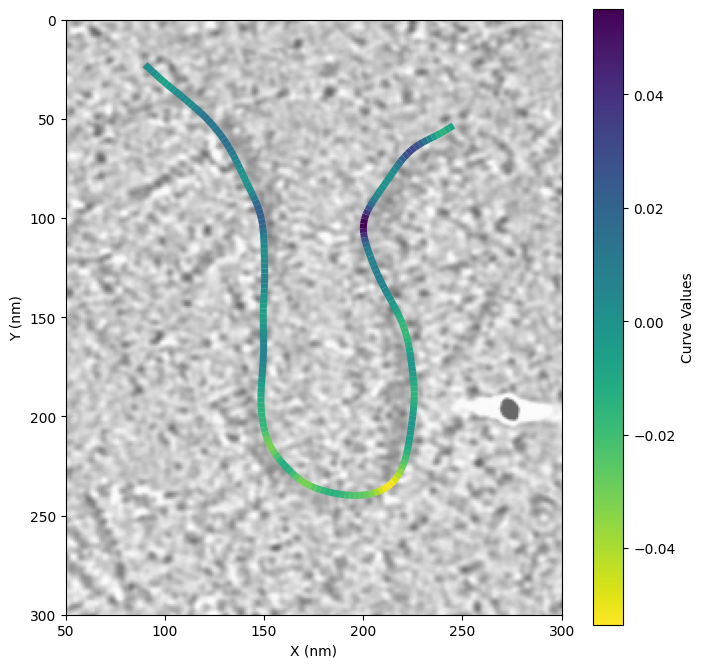

In [28]:
import numpy as np
from pathlib import Path
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry
from plot import plot_coord_curve

file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

coords = np.load(f"dat/coat_test/relaxed_coords.npy")

curvature = OpenPlaneCurveGeometry.edge_curvature(coords)
# curvature += 0.05

print(np.max(curvature))
print(np.min(curvature))
print(np.average(curvature))
print(np.average(abs(curvature)))

# curvature = np.where(curvature < 0, 1, 0)

# plot_coord_curve(file.stem, coords, curvature, xlim = (50, 300), ylim=(300, 0))
plot_coord_curve(file.stem, coords, curvature, xlim = (50, 300), ylim=(300, 0), save_image=True)


Image saved at figures/test.png


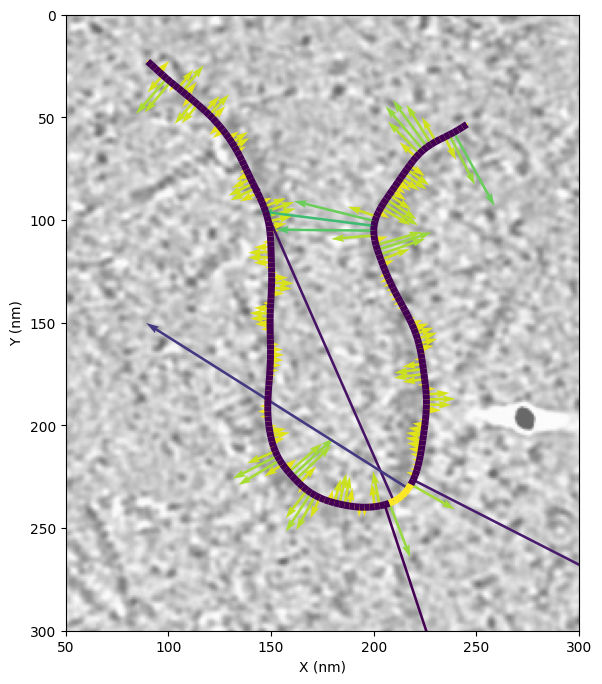

In [2]:
# Memo

import numpy as np
from pathlib import Path
from coat_test import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry


file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

coords = np.load(f"dat/coat_test/relaxed_coords.npy")
curvature = OpenPlaneCurveGeometry.edge_curvature(coords)

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

cvt_thre = -0.04
spont_c = np.where(curvature < cvt_thre, curvature, 0)
forces = get_force_density(parameters, coords, spont_c)
curvature_bin = np.where(curvature < cvt_thre, 1, 0)
# output_filename = "coat_test/thre_004.png"

plot_coord_curve_force(file.stem, coords, curvature_bin, forces[0,:], xlim=(50, 300), ylim=(300, 0), scale_factor=0.001, output_filename = output_filename)




Image saved at figures/coat_test/exact.png


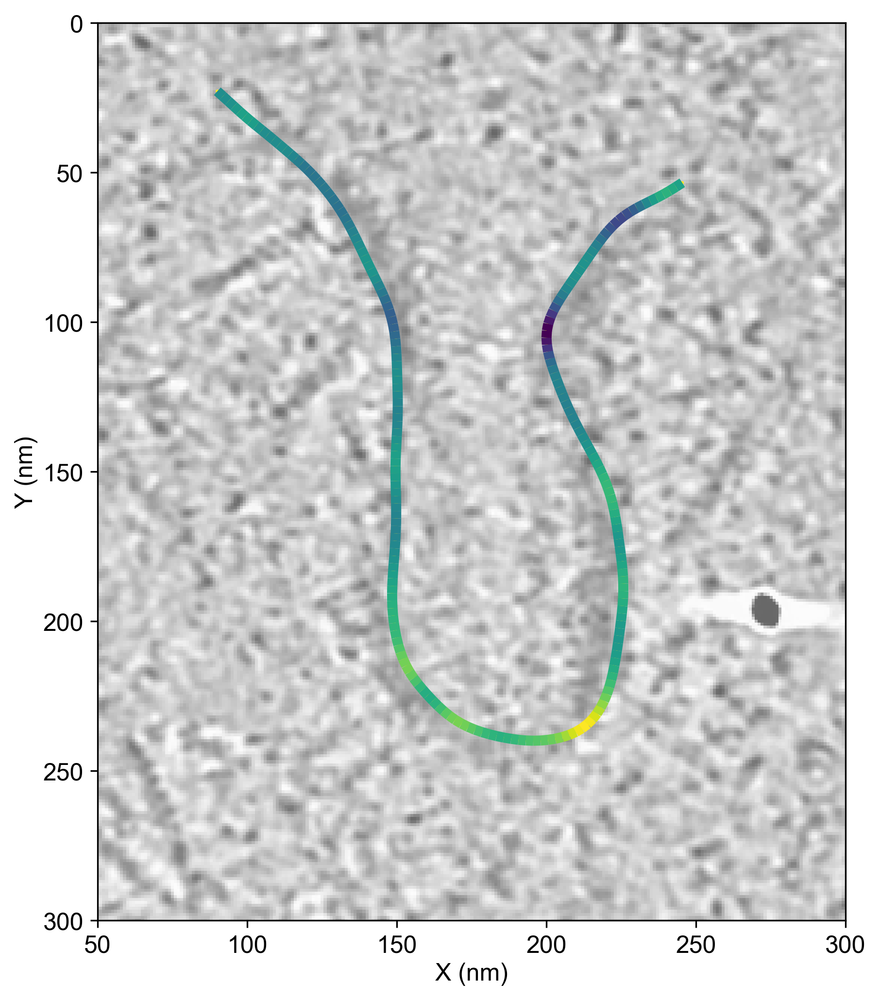

In [17]:
# \bar{H} = H

import numpy as np
from pathlib import Path
from variation_run import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry


file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

coords = np.load(f"dat/coat_test/relaxed_coords.npy")
curvature = OpenPlaneCurveGeometry.edge_curvature(coords)

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

forces = get_force_density(parameters, coords, curvature)
output_filename = "coat_test/exact.png"

plot_coord_curve_force(file.stem, coords, curvature, forces[0,:], xlim=(50, 300), ylim=(300, 0), scale_factor=0.001, output_filename = output_filename, cmap = 'viridis_r', force_vmin=0.005, force_vmax=0.05)



Image saved at figures/coat_test/thre_0.png


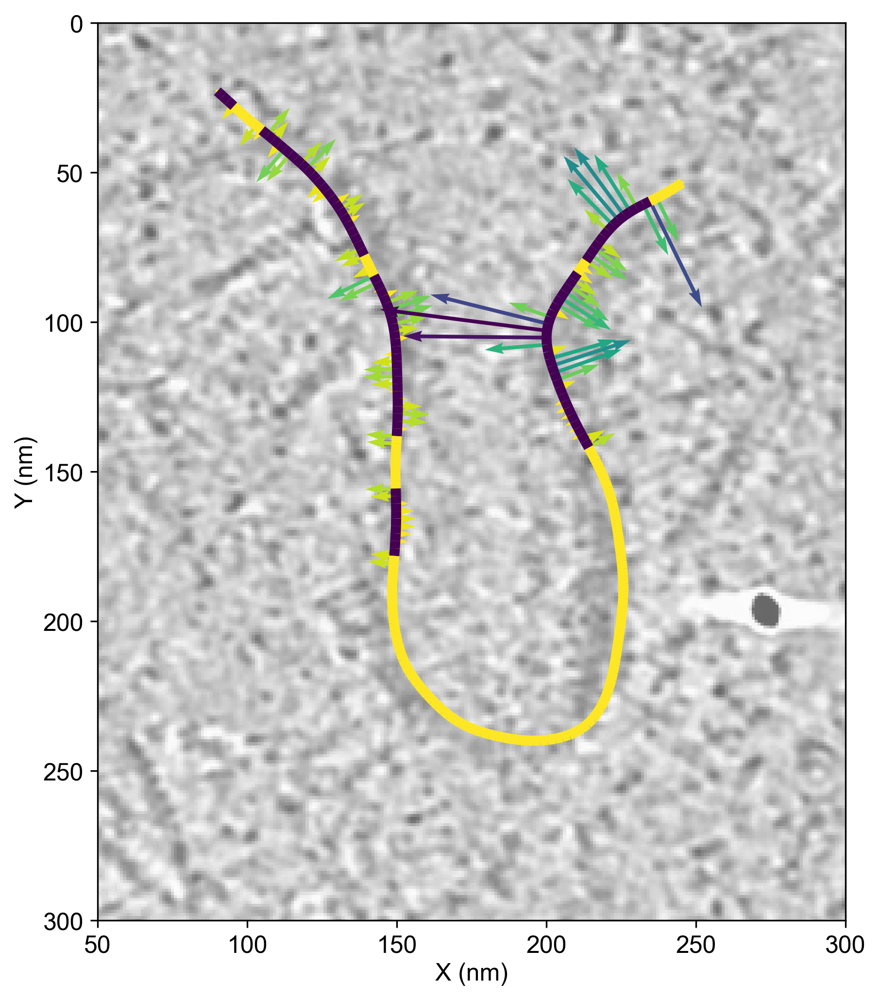

Image saved at figures/coat_test/thre_001.png


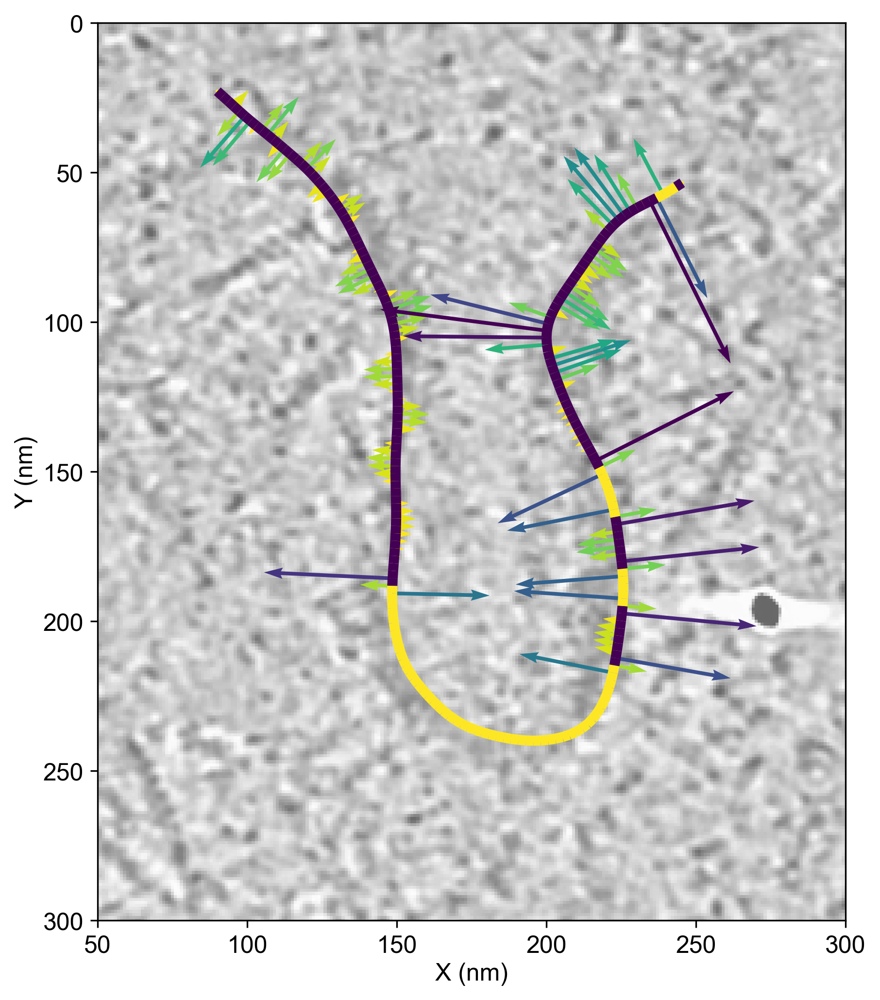

Image saved at figures/coat_test/thre_002.png


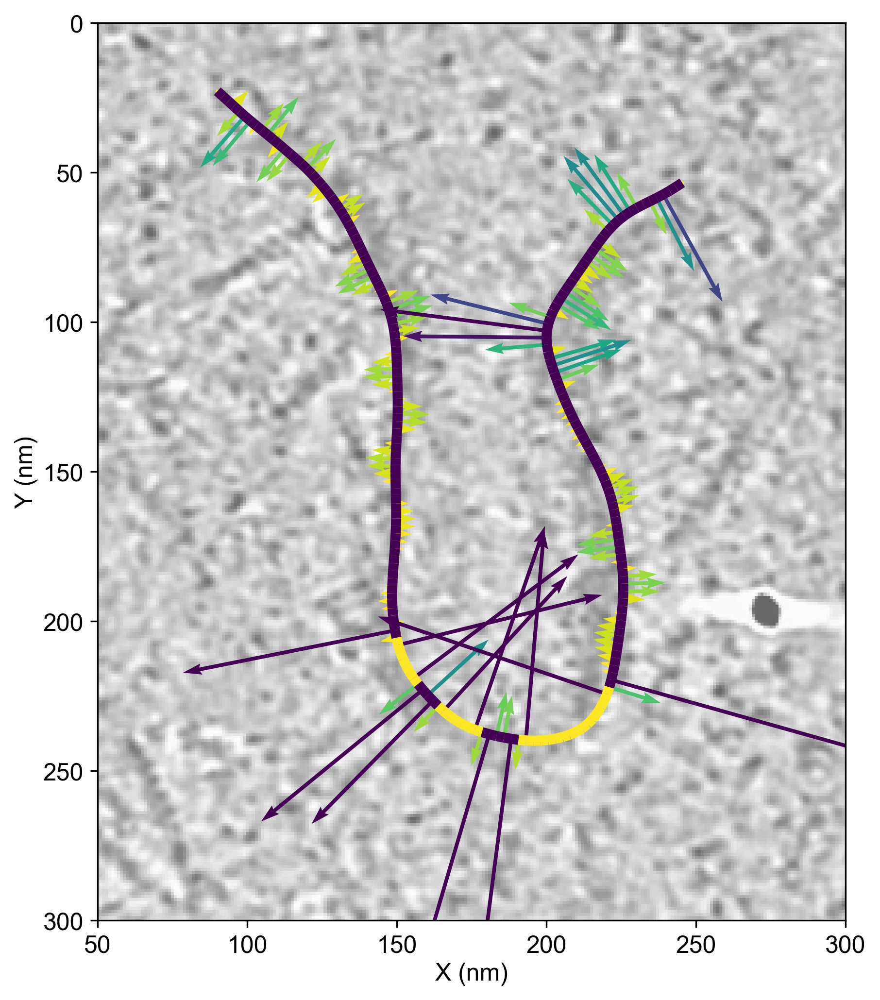

Image saved at figures/coat_test/thre_003.png


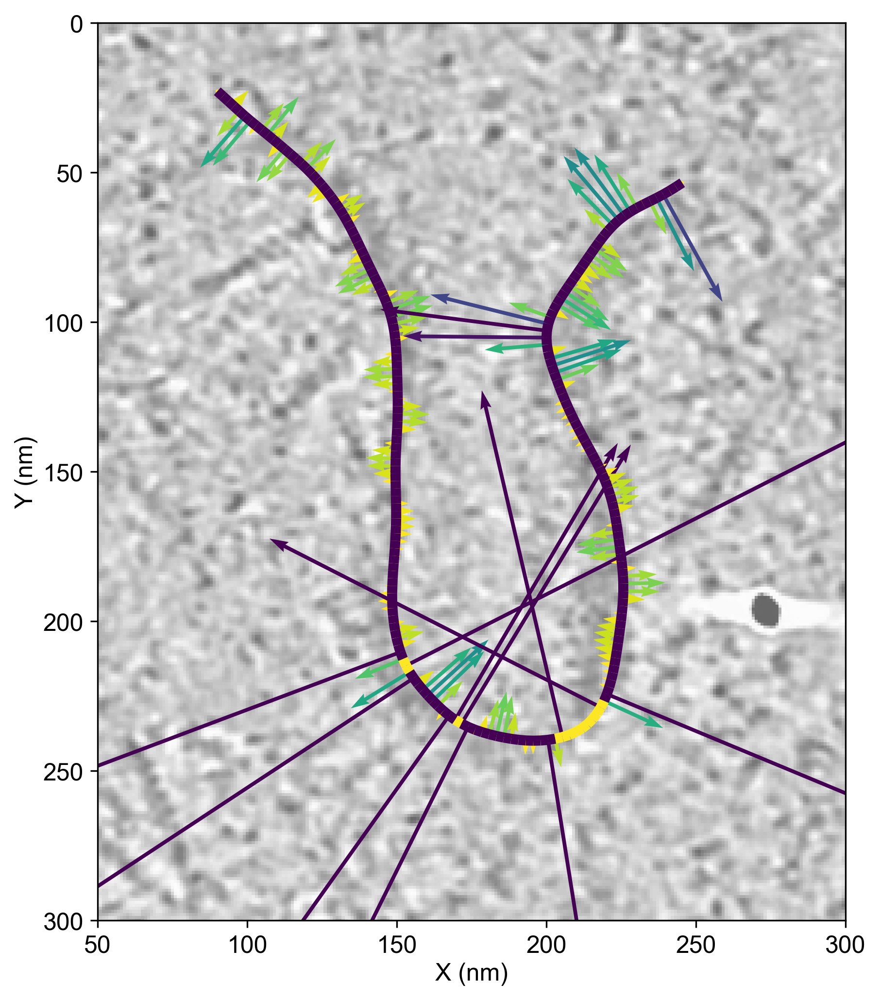

Image saved at figures/coat_test/thre_004.png


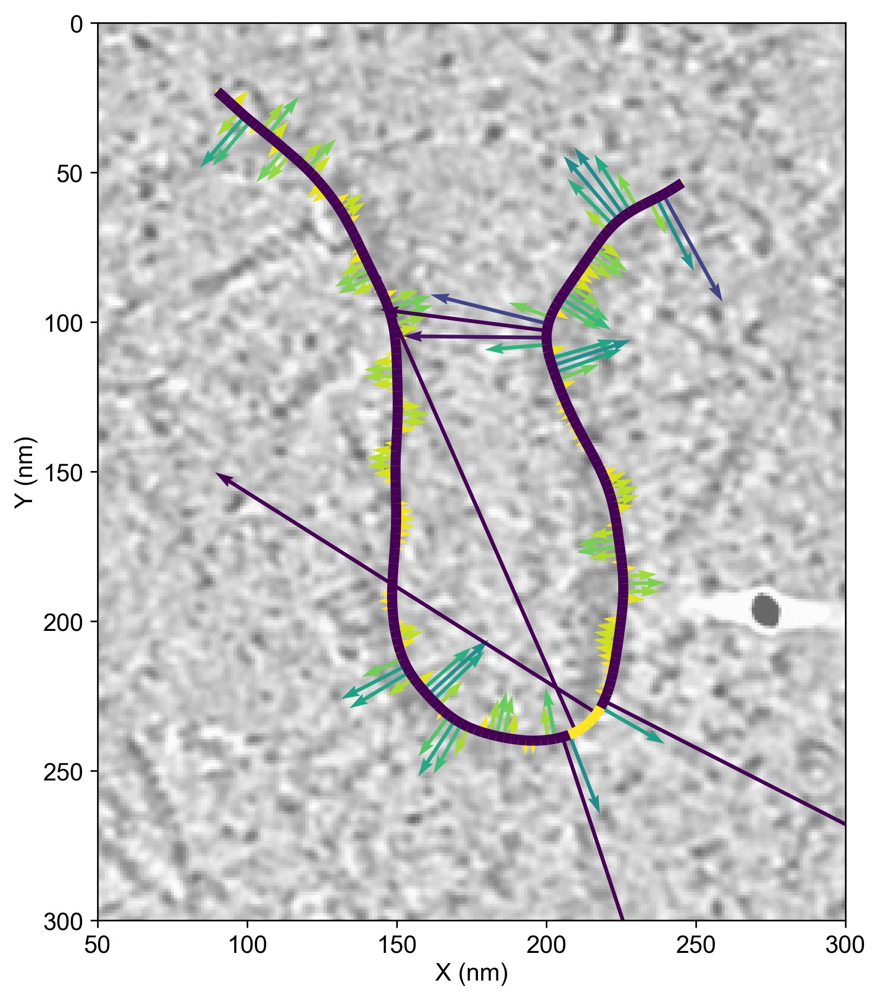

In [18]:
# Threshold

import numpy as np
from pathlib import Path
from variation_run import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry


file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

# Load coordinates and compute curvature
coords = np.load(f"dat/coat_test/relaxed_coords.npy")
curvature = OpenPlaneCurveGeometry.edge_curvature(coords)

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

cvt_thre_values = [0, -0.01, -0.02, -0.03, -0.04]

for cvt_thre in cvt_thre_values:
    coords = np.load(f"dat/coat_test/relaxed_coords.npy")
    spont_c = np.where(curvature < cvt_thre, curvature, 0)
    forces = get_force_density(parameters, coords, spont_c)
    curvature_bin = np.where(curvature < cvt_thre, 1, 0)
    output_filename = f"coat_test/thre_{str(abs(cvt_thre)).replace('.', '')}.png"
    
    plot_coord_curve_force(
        file.stem, 
        coords,
        curvature_bin, 
        forces[0, :], 
        xlim=(50, 300), 
        ylim=(300, 0), 
        scale_factor=0.001, 
        output_filename=output_filename,
        force_vmin=0.005, force_vmax=0.05
    )


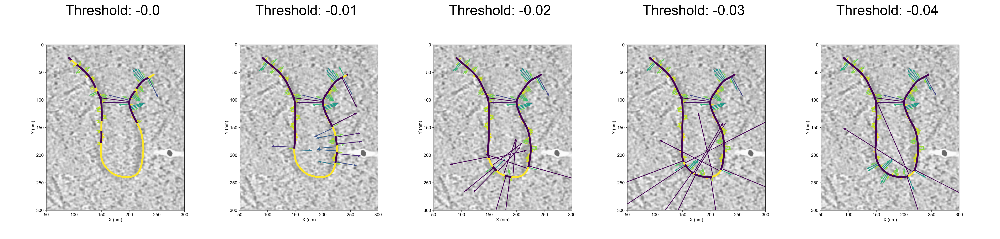

In [19]:
# Plot figures side by side 

import matplotlib.pyplot as plt
from PIL import Image
import os

# Directory where images are stored
image_dir = "figures/coat_test/"

# List of image filenames
image_files = [
    "thre_0.png", 
    "thre_001.png", 
    "thre_002.png", 
    "thre_003.png", 
    "thre_004.png"
]

num_images = len(image_files)

fig, axes = plt.subplots(1, num_images, figsize=(20, 5))

for i, image_file in enumerate(image_files):
    # Open image using PIL
    img_path = os.path.join(image_dir, image_file)
    img = Image.open(img_path)
    
    # Display image in the i-th subplot
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axes/ticks
    axes[i].set_title(f"Threshold: {i * -0.01}", fontsize=20)

# plt.tight_layout()
plt.subplots_adjust(wspace=-0.1)
plt.subplots_adjust(left=0.01, right=0.99, bottom=0.01)


plt.savefig("figures/coat_test/threshold.png", dpi=300)
plt.show()



In [20]:
# Set continuous contour part

import numpy as np
from pathlib import Path
from coat_test import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry

file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

# Load coordinates and compute curvature
coords = np.load(f"dat/coat_test/relaxed_coords.npy")
curvature = OpenPlaneCurveGeometry.edge_curvature(coords)

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

coords = np.load(f"dat/coat_test/relaxed_coords.npy")
spont_c = np.where(curvature < 0, curvature, 0)

# Threshold for segment length
threshold = 8  # Example threshold

# Step 2: Find the indices of non-zero values
non_zero_indices = np.where(spont_c != 0)[0]

# Step 3: Identify continuous segments of non-zero values
continuous_segments = np.split(non_zero_indices, np.where(np.diff(non_zero_indices) != 1)[0] + 1)

# Step 4: Filter out segments whose lengths are less than the threshold
filtered_spont_c = np.zeros_like(spont_c)  # Initialize with zeros
for segment in continuous_segments:
    if len(segment) >= threshold:
        filtered_spont_c[segment] = spont_c[segment]  # Keep segments that meet the length threshold

# Now, filtered_spont_c contains only the segments with lengths >= threshold
print(filtered_spont_c)

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.00016014
 -0.00273882 -0.00544383 -0.00813451 -0.01061834 -0.01267223 -0.01411972
 -0.01495037 -0.01541984 -0.01604306 -0.01743168 -0.02001103 -0.02371034
 -0.02774196 -0.03065441 -0.03090021 -0.02782805 -0.02233885 -0.01

Image saved at figures/coat_test/h0_0.png


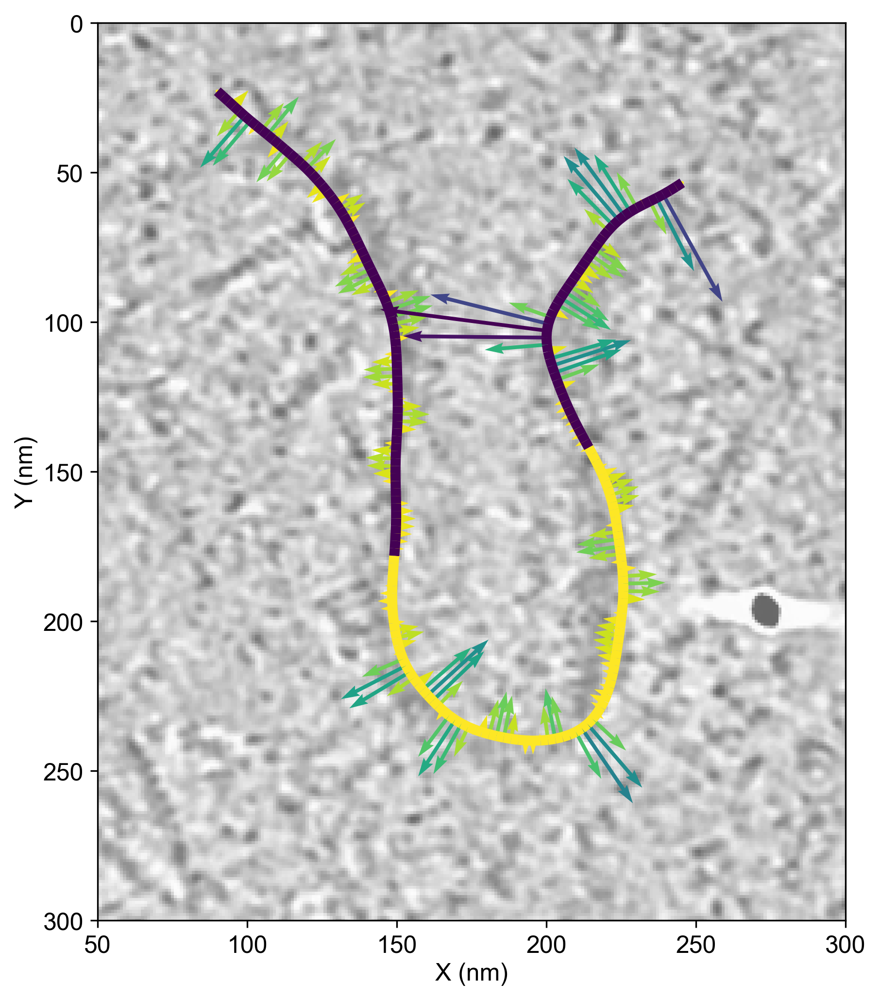

Image saved at figures/coat_test/h0_001.png


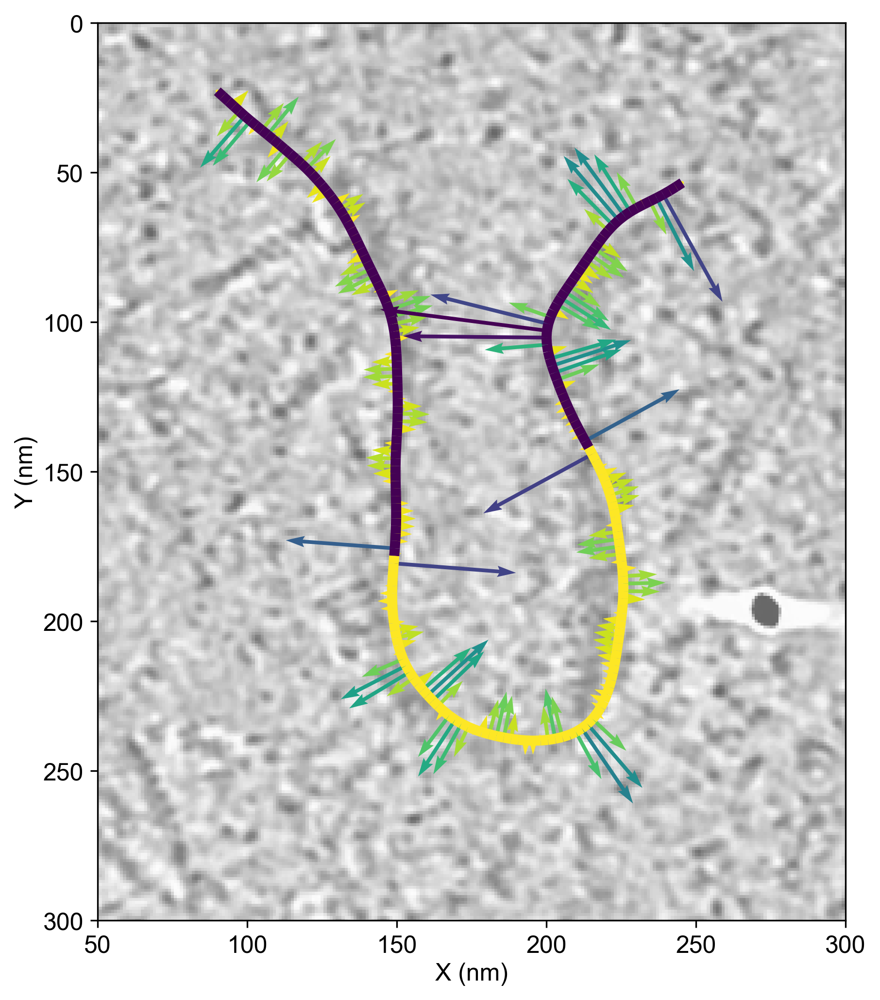

Image saved at figures/coat_test/h0_002.png


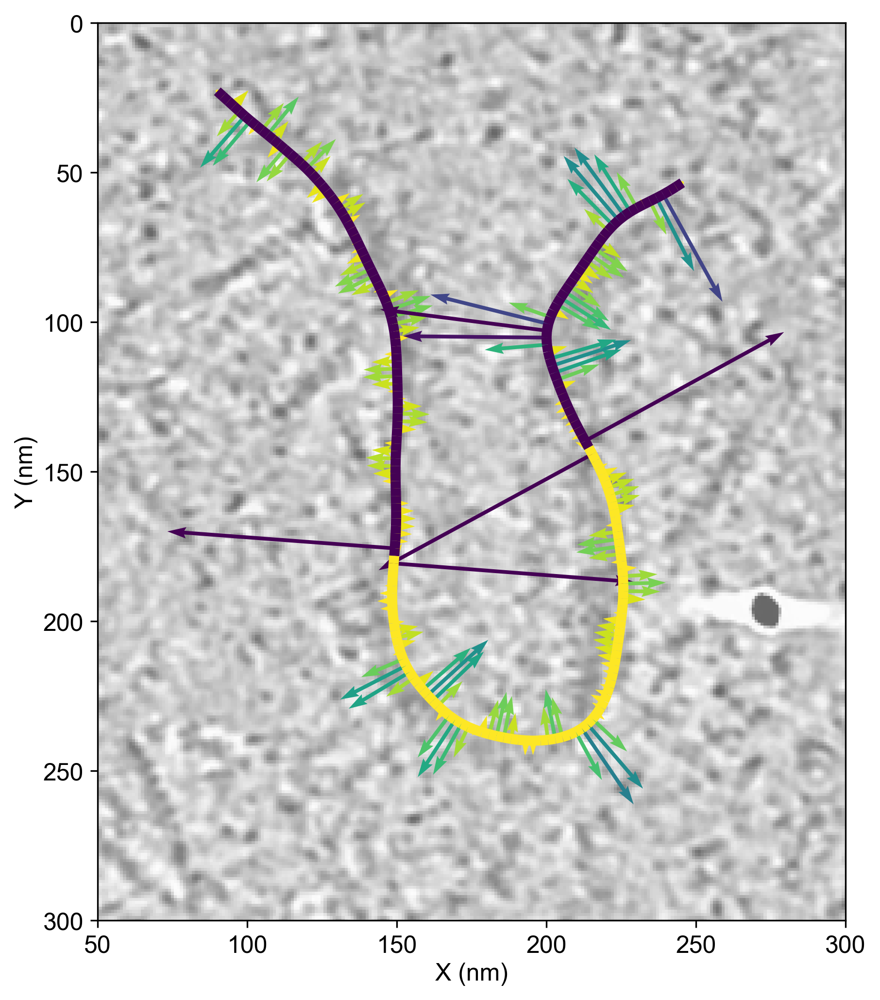

Image saved at figures/coat_test/h0_003.png


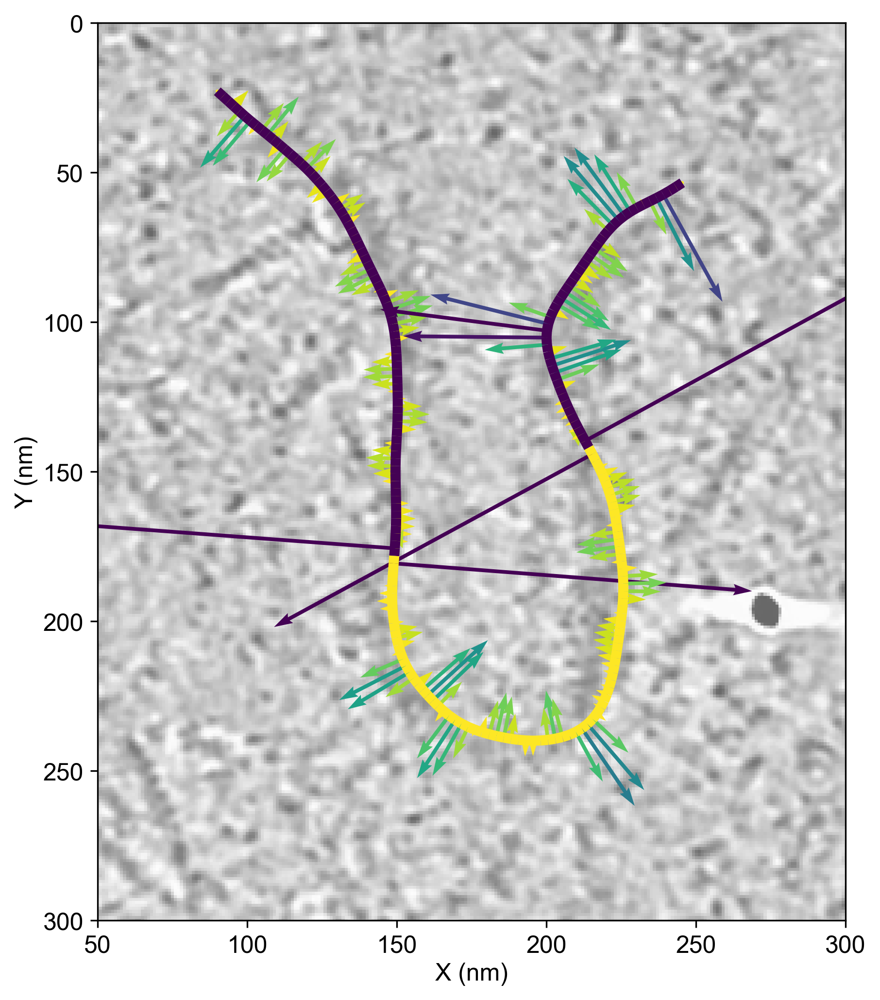

Image saved at figures/coat_test/h0_004.png


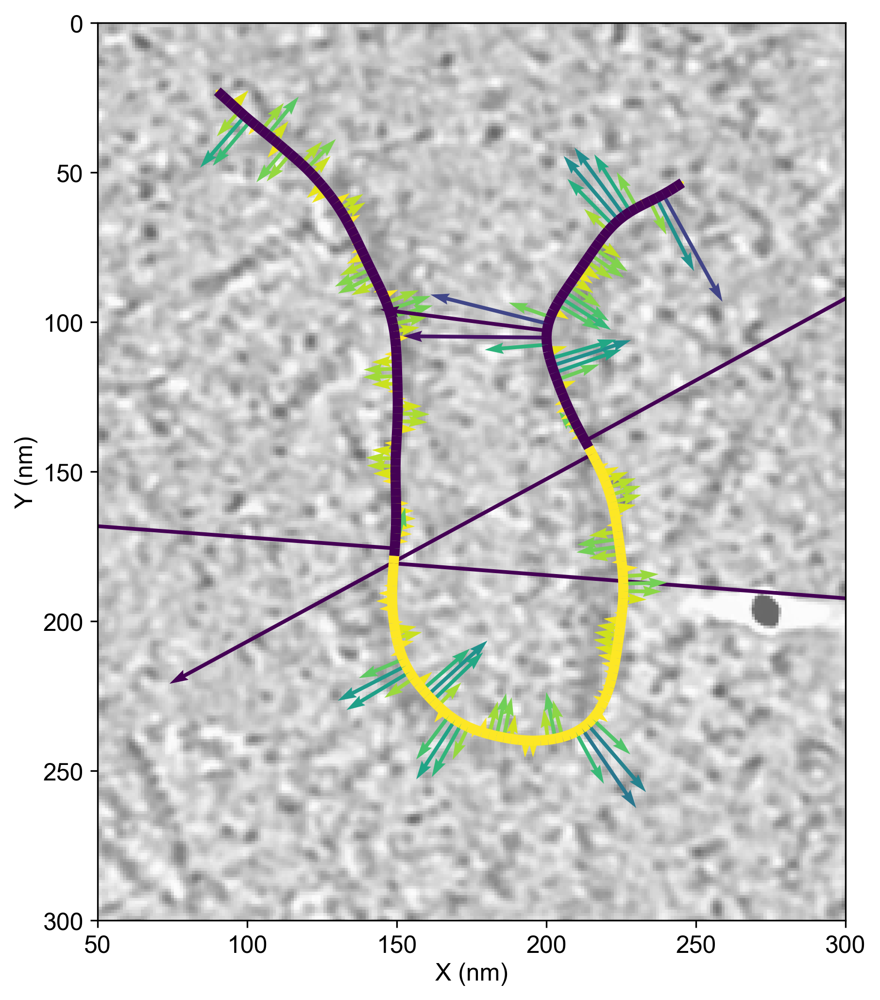

In [21]:
# Specific contour part

import numpy as np
from pathlib import Path
from variation_run import get_force_density
from plot import plot_coord_force, plot_coord_curve_force
from automembrane.energy import OpenPlaneCurveMaterial
from automembrane.geometry import OpenPlaneCurveGeometry


file = Path('coordinates/Membrane_2018June_Tomo26_CME_Invagination.txt')

# Load coordinates and compute curvature
coords = np.load(f"dat/coat_test/relaxed_coords.npy")
curvature = OpenPlaneCurveGeometry.edge_curvature(coords)

parameters = {
    "Kb": 100/4,  # Bending modulus (pN um; original 1e-19 J)
    "Ksg": 0.5,  # Global stretching modulus (pN um/um^2; original 0.05 mN/m)
    "Ksl": 0,    # Regularization modulus (pN um; 0), 
    "boundary": "fixed"
}

cvt_values = [0, -0.01, -0.02, -0.03, -0.04]

for cvt in cvt_values:
    coords = np.load(f"dat/coat_test/relaxed_coords.npy")
    spont_c = np.where(filtered_spont_c != 0, cvt, 0)
    forces = get_force_density(parameters, coords, spont_c)
    curvature_bin = np.where(filtered_spont_c != 0, 1, 0)
    output_filename = f"coat_test/h0_{str(abs(cvt)).replace('.', '')}.png"
    
    plot_coord_curve_force(
        file.stem, 
        coords,
        curvature_bin, 
        forces[0, :], 
        xlim=(50, 300), 
        ylim=(300, 0), 
        scale_factor=0.001, 
        output_filename=output_filename, 
        force_vmin=0.005, force_vmax=0.05
    )


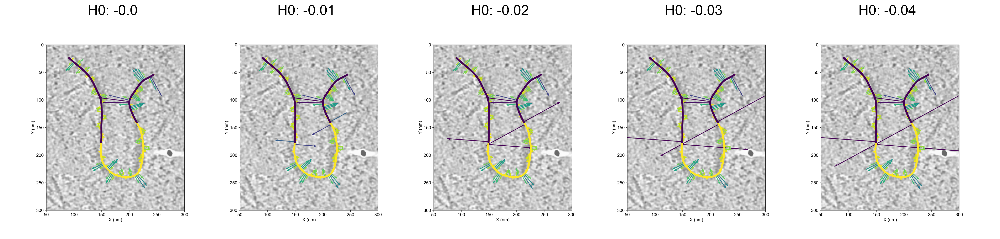

In [22]:
# Plot figures side by side 

import matplotlib.pyplot as plt
from PIL import Image
import os

# Directory where images are stored
image_dir = "figures/coat_test/"

# List of image filenames
image_files = [
    "h0_0.png", 
    "h0_001.png", 
    "h0_002.png", 
    "h0_003.png", 
    "h0_004.png"
]

num_images = len(image_files)

fig, axes = plt.subplots(1, num_images, figsize=(20, 5))

for i, image_file in enumerate(image_files):
    # Open image using PIL
    img_path = os.path.join(image_dir, image_file)
    img = Image.open(img_path)
    
    # Display image in the i-th subplot
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axes/ticks
    axes[i].set_title(f"H0: {i * -0.01}", fontsize=20)

# plt.tight_layout()
plt.subplots_adjust(wspace=-0.1)
plt.subplots_adjust(left=0.01, right=0.99, bottom=0.01)


plt.savefig("figures/coat_test/const.png", dpi=300)
plt.show()
